In [8]:
import numpy as np
import gymnasium as gym
from time import sleep
import matplotlib.pyplot as plt
import seaborn as sns

In [9]:
class FrozenLake(gym.Env):
    def __init__(self,gridsize=4):
        super(FrozenLake,self).__init__()
        self.gridsize=gridsize

        self.action_space=gym.spaces.Discrete(4)
        self.observation_space=gym.spaces.Discrete(gridsize*gridsize)

        self.start=(0,0)

        self.ground=np.array([
            ["S","F","F","F"],
            ["F","H","F","H"],
            ["F","F","F","H"],
            ["H","F","F","G"]
        ])

        self.goal=(gridsize-1,gridsize-1)

        self.place_coin()
    
    def place_coin(self):
        while(1):
            pos=np.random.randint(0,self.gridsize,2)
            if(self.ground[pos[0]][pos[1]]=='F'):
                self.ground[pos[0]][pos[1]]='C'
                break

    def step(self,state,action):
        x,y=self._get_state_xy(state)

        if action == 0:  # Left
            y = max(0, y - 1)
        elif action == 1:  # Down
            x = min(self.gridsize - 1, x + 1)
        elif action == 2:  # Right
            y = min(self.gridsize - 1, y + 1)
        elif action == 3:  # Up
            x = max(0, x - 1)

        next_state=x,y

        reward = self.get_reward(next_state)

        done = self.ground[x, y] == 'H' or self.ground[x, y] == 'G'

        return self._get_state_index(next_state), reward, done, {},{}

    def get_reward(self,state):
        if(state==(self.gridsize-1,self.gridsize-1)):
            return 100
        elif(self.ground[state[0],state[1]]=='H'):
            return -100
        elif(self.ground[state[0],state[1]]=='C'):
            return 10
        else:
            return -1

    def reset(self):
        return [self._get_state_index((0,0))]

    def _get_state_index(self,state):
        return state[0] * self.gridsize + state[1]

    def _get_state_xy(self,state):
        return (int(state/self.gridsize),state%self.gridsize)

    def render(self,showStep=False):
        if(showStep):
            sleep(0.05)
            print(end='\033[2J')
            print(end='\033[H')

        for i in range(self.gridsize):
            for j in range(self.gridsize):
                if(self.start==(i,j)):
                    print('S',end=' ')
                elif(self.ground[i][j]=='F'):
                    print('.',end=' ')
                else:
                    print(self.ground[i][j],end=' ')
            print()  

In [10]:
class SARSA_Agent():
    def __init__(self,env,alpha=0.1,gamma=0.99):
        self.env=env
        self.alpha=alpha
        self.gamma=gamma
        self.Q=np.zeros((self.env.observation_space.n,self.env.action_space.n))
        self.gridsize=int(np.sqrt(self.env.observation_space.n))
        self.state=self.env.reset()[0]

    def policy(self,state,epsilon):
        random=np.random.rand(1)
        if(random<epsilon):
            return self.env.action_space.sample()
        else:
            return np.argmax(self.Q[state])
    
    def train(self,episodes=1000,visualize_interval=100):
        epsilon=1
        for episode in range(episodes):
            self.state=self.env.reset()[0]
            action=self.policy(self.state,epsilon)
            done=False

            while not done:
                next_state,next_action,done=self.step(action,epsilon)
                self.state,action=next_state,next_action
            if(episode%visualize_interval==0 or episode==episodes-1):
                self.visualize_Q_value(episode)
            epsilon=max(0.01, epsilon * 0.99)
        print(self.Q)

    def step(self,action,epsilon):
        next_state,reward,done,_,_=self.env.step(self.state,action)
        next_action=self.policy(next_state,epsilon)
        self.Q[self.state][action]+=self.alpha*(reward+self.gamma*self.Q[next_state][next_action]-self.Q[self.state][action])
        return next_state,next_action,done

    def visualize_Q_value(self,episode=-1):
        fig,ax=plt.subplots()
        fig.suptitle(f"State-Action Function at Agent {episode}")

        reshaped = self.Q.reshape(self.gridsize, self.gridsize, self.env.action_space.n)
        max_Q_values = reshaped.max(axis=2)
        best_actions = np.argmax(reshaped, axis=2)

        sns.heatmap(max_Q_values, annot=True, cmap="coolwarm", cbar=True, fmt=".2f", linewidths=0.5)

        action_symbols = ["←", "↓", "→", "↑"]

        for i in range(self.gridsize):
            for j in range(self.gridsize):
                action = best_actions[i, j]
                ax.text(j + 0.8, i + 0.5, action_symbols[action], 
                        ha='center', va='center', fontsize=14, color='black', fontweight='bold')
        return fig

In [11]:
class QLearn_Agent():
    def __init__(self,env,alpha=0.1,gamma=0.99):
        self.env=env
        self.alpha=alpha
        self.gamma=gamma
        self.Q=np.zeros((self.env.observation_space.n, self.env.action_space.n))
        self.gridsize=int(np.sqrt(self.env.observation_space.n))
        self.state=self.env.reset()[0]
    
    def policy(self,state,epsilon):
        random=np.random.rand(1)
        if(random<epsilon):
            return self.env.action_space.sample()
        else:
            return np.argmax(self.Q[state])
    
    def train(self,episodes=1000,visualize_interval=100):
        epsilon=1
        for episode in range(episodes):
            self.state=self.env.reset()[0]
            done=False

            while not done:
                action=self.policy(self.state,epsilon)
                # next_state,reward,done,_,_=self.env.step(state,action)
                # self.Q[state][action]+=self.alpha*(reward+self.gamma*(self.Q[next_state].max())-self.Q[state][action])
                next_state,done=self.step(action)
                self.state=next_state
            if(episode%visualize_interval==0 or episode==episodes-1):
                self.visualize_Q_value(episode)
            epsilon=max(0.01, epsilon * 0.99)
        print("Final Q-Table:\n", self.Q)

    def step(self,action):
        next_state,reward,done,_,_=self.env.step(self.state,action)
        self.Q[self.state][action]+=self.alpha*(reward+self.gamma*(self.Q[next_state].max())-self.Q[self.state][action])
        return next_state,done

    def visualize_Q_value(self, episode=-1):
        fig,ax=plt.subplots()
        fig.suptitle(f"State-Action Function of Agent {episode}")

        reshaped = self.Q.reshape(self.gridsize, self.gridsize, self.env.action_space.n)
        max_Q_values = reshaped.max(axis=2)
        best_actions = np.argmax(reshaped, axis=2)

        sns.heatmap(max_Q_values, annot=True, cmap="coolwarm", cbar=True, fmt=".2f", linewidths=0.5)

        action_symbols = ["←", "↓", "→", "↑"]

        for i in range(self.gridsize):
            for j in range(self.gridsize):
                action = best_actions[i, j]
                ax.text(j + 0.8, i + 0.5, action_symbols[action], 
                        ha='center', va='center', fontsize=14, color='black', fontweight='bold')
        return fig

In [12]:
class MultiAgent():
    def __init__(self,env):
        self.env=env
        self.agent1=SARSA_Agent(env)
        self.agent2=QLearn_Agent(env)

    def train(self,episodes=1000,visualize_interval=100):
        epsilon=1
        for episode in range(episodes):
            done1=False
            done2=False

            self.agent1.state=self.env.reset()[0]
            self.agent2.state=self.env.reset()[0]

            coin1=0
            coin2=0

            action1=self.agent1.policy(self.agent1.state,epsilon)

            print(f"Episode {episode+1}:")
            while not (done1 and done2):
                steps1=2 if coin1 else 1
                steps2=2 if coin2 else 1
                
                coin1=max(0,coin1-1)
                coin2=max(0,coin2-1)
                
                self.display_env()
                #SARSA Agent takes a step
                while(not done1 and steps1):
                    prev_action1=action1
                    self.agent1.state,action1,done1=self.agent1.step(action1,epsilon)
                    steps1-=1
                
                #Q Learn Agent take a step
                while(not done2 and steps2):
                    action2=self.agent2.policy(self.agent2.state,epsilon)
                    self.agent2.state,done2=self.agent2.step(action2)
                    steps2-=1

                done1,done2,epsilon=self.agents_pushback(done1,prev_action1,done2,action2,epsilon)

                if(not done1 and self.env.ground[self.env._get_state_xy(self.agent1.state)]=='C'):
                    self.env.place_coin()
                    self.env.ground[self.env._get_state_xy(self.agent1.state)]='F'
                    coin1=4
                if(not done2 and self.env.ground[self.env._get_state_xy(self.agent2.state)]=='C'):
                    self.env.place_coin()
                    self.env.ground[self.env._get_state_xy(self.agent2.state)]='F'
                    coin2=4

            self.display_env()
            epsilon=max(0.01, epsilon * 0.99)
        fig1=self.agent1.visualize_Q_value(1)
        fig2=self.agent2.visualize_Q_value(2)

    def agents_pushback(self,done1,prev_action1,done2,action2,epsilon):
        if(self.agent1.state==self.agent2.state and not (done1 or done2)):
            # print("Collision")
            self.agent1.state,_,done1,_,_=self.env.step(self.agent1.state,(prev_action1+2)%4)
            self.agent2.state,_,done2,_,_=self.env.step(self.agent2.state,(action2+2)%4)
            epsilon=max(0.01, epsilon/0.99)
        return done1,done2,epsilon


    def display_env(self):
        for i in range(self.env.gridsize):
            for j in range(self.env.gridsize):
                state_index=self.env._get_state_index((i,j))
                if(state_index==self.agent1.state and state_index==self.agent2.state):
                    print("B ",end=" ")
                elif(state_index==self.agent1.state):
                    print("1 ",end=" ")
                elif(state_index==self.agent2.state):
                    print("2 ",end=" ")
                elif(self.env.ground[i][j]=='F' or self.env.ground[i][j]=='S'):
                    print(". ",end=" ")
                else:
                    print(f"{self.env.ground[i][j]} ",end=" ")
            print("\n")
        print("\n")

Episode 1:
B  .  .  C  

.  H  .  H  

.  .  .  H  

H  .  .  G  



2  .  .  C  

1  H  .  H  

.  .  .  H  

H  .  .  G  



2  .  .  C  

.  H  .  H  

1  .  .  H  

H  .  .  G  



2  .  .  C  

1  H  .  H  

.  .  .  H  

H  .  .  G  



1  2  .  C  

.  H  .  H  

.  .  .  H  

H  .  .  G  



.  2  .  C  

1  H  .  H  

.  .  .  H  

H  .  .  G  



.  .  .  C  

1  2  .  H  

.  .  .  H  

H  .  .  G  



.  .  .  C  

1  2  .  H  

.  .  .  H  

H  .  .  G  



.  .  .  C  

.  B  .  H  

.  .  .  H  

H  .  .  G  



Episode 2:
B  .  .  C  

.  H  .  H  

.  .  .  H  

H  .  .  G  



.  2  .  C  

1  H  .  H  

.  .  .  H  

H  .  .  G  



.  .  2  C  

.  H  .  H  

1  .  .  H  

H  .  .  G  



.  .  .  2  

.  H  .  H  

C  .  .  H  

1  .  .  G  



.  2  .  .  

.  H  .  H  

C  .  .  H  

1  .  .  G  



.  2  .  .  

.  H  .  H  

C  .  .  H  

1  .  .  G  



.  .  .  .  

2  H  .  H  

C  .  .  H  

1  .  .  G  



.  .  .  .  

2  H  .  H  

C  .  .  H  

1  .  . 

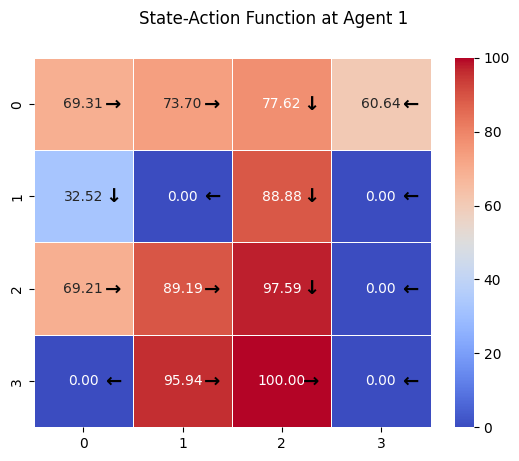

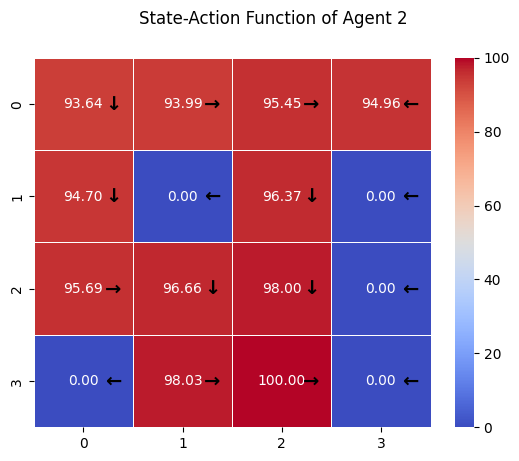

In [13]:
env=FrozenLake()
agents=MultiAgent(env)
agents.train(episodes=8000)

In [14]:
# ["S","F","F","F"],
# ["F","H","F","H"],
# ["F","F","F","H"],
# ["H","F","F","G"]